# Disentanglix development

## Testing with real data

In [1]:
import autoencodix as acx
from autoencodix.data.datapackage import DataPackage
from autoencodix.configs.default_config import DataCase
from autoencodix.configs.disentanglix_config import DisentanglixConfig
import pandas as pd

df_rna = pd.read_parquet("./input_data_test/combined_rnaseq_formatted.parquet")
df_meth = pd.read_parquet("./input_data_test/combined_meth_formatted.parquet")
df_anno = pd.read_parquet("./input_data_test/combined_clin_formatted.parquet")

data_package = DataPackage()
data_package.multi_bulk = {"transcriptomics": df_rna, "epigenetic": df_meth}
data_package.annotation = {
	"paired": df_anno.copy(),
}


my_cfg = DisentanglixConfig(
	data_case=DataCase.MULTI_BULK,
	loss_reduction="sum",
	k_filter=2000,
	latent_dim=2,
	scaling="STANDARD",
	# filtering="VAR", ## Setting globally not possible anymore
	epochs=200,
	# epochs=50,
	learning_rate=0.0001,
	batch_size = 128,
	beta_mi = 1,
	beta_tc = 3000,
	beta_dimKL= 0.5,
	use_mss = True,
	drop_p =0.1,
	global_seed=42,
	checkpoint_interval=25,
	n_layers=1)

In [2]:
disent = acx.Disentanglix(data=data_package, config=my_cfg)


in handle_direct_user_data with data: <class 'autoencodix.data.datapackage.DataPackage'>


In [3]:
disent.run()

--- Running Pairing-Aware Split ---
Identified 3529 fully paired samples across all modalities.
Identified 0 samples present in at least one, but not all, modalities.
Successfully generated synchronized indices for all modalities.
cur shape: transcriptomics: (2470, 1000)
cur shape: epigenetic: (2470, 1000)
cur shape: transcriptomics: (706, 1000)
cur shape: epigenetic: (706, 1000)
cur shape: transcriptomics: (353, 1000)
cur shape: epigenetic: (353, 1000)
Training ...
Epoch 1 - Train Loss: 5591075.4297
Sub-losses: recon_loss: 5591073.0000, mut_info_loss: 0.0500, tot_corr_loss: 2.4569, dimwise_kl_loss: 0.0792, anneal_factor: 0.0000, effective_beta_mi_factor: 0.0000, effective_beta_tc_factor: 0.1362, effective_beta_dimKL_factor: 0.0000
Epoch 1 - Valid Loss: 715450.4375
Sub-losses: recon_loss: 715448.1719, mut_info_loss: 0.0123, tot_corr_loss: 2.2455, dimwise_kl_loss: 0.0370, anneal_factor: 0.0000, effective_beta_mi_factor: 0.0000, effective_beta_tc_factor: 0.1362, effective_beta_dimKL_fact

Result Object Public Attributes:
------------------------------
latentspaces: TrainingDynamics object
sample_ids: TrainingDynamics object
reconstructions: TrainingDynamics object
mus: TrainingDynamics object
sigmas: TrainingDynamics object
losses: TrainingDynamics object
sub_losses: LossRegistry(_losses={'recon_loss': TrainingDynamics(), 'mut_info_loss': TrainingDynamics(), 'tot_corr_loss': TrainingDynamics(), 'dimwise_kl_loss': TrainingDynamics(), 'anneal_factor': TrainingDynamics(), 'effective_beta_mi_factor': TrainingDynamics(), 'effective_beta_tc_factor': TrainingDynamics(), 'effective_beta_dimKL_factor': TrainingDynamics()})
preprocessed_data: Tensor of shape (0,)
model: VarixArchitecture
model_checkpoints: TrainingDynamics object
datasets: DatasetContainer(train=<autoencodix.data._numeric_dataset.NumericDataset object at 0x74c5a7e23df0>, valid=<autoencodix.data._numeric_dataset.NumericDataset object at 0x74c5a7e21630>, test=<autoencodix.data._numeric_dataset.NumericDataset object

Creating plots ...


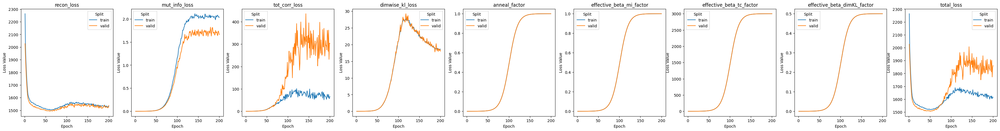

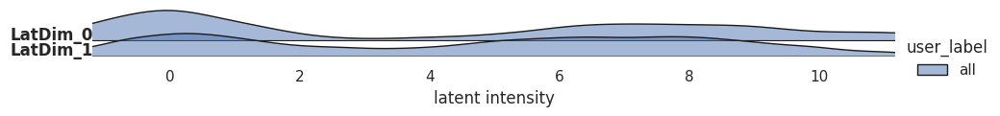

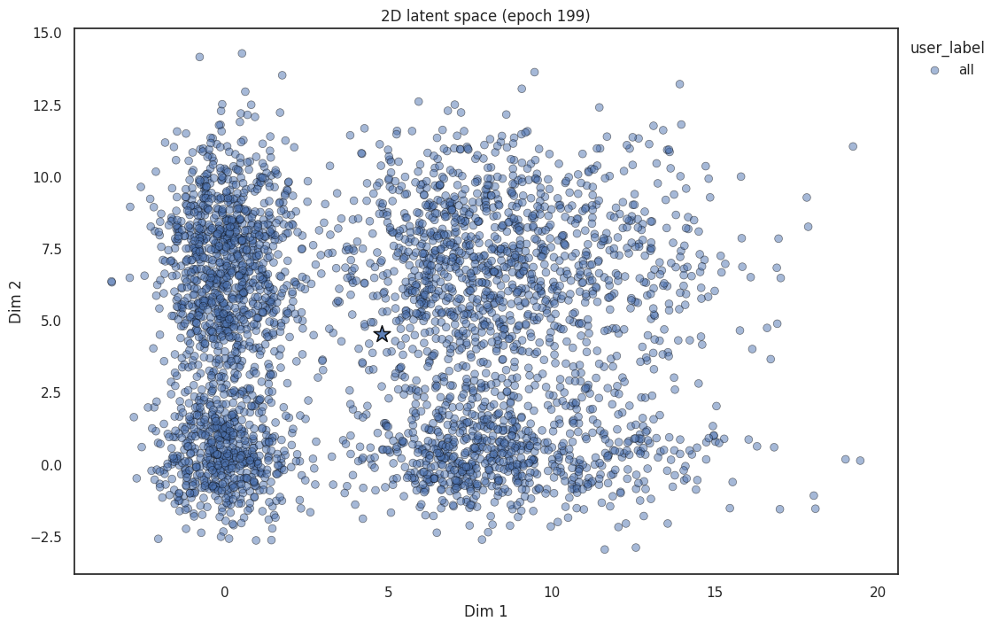

In [4]:
disent.show_result()

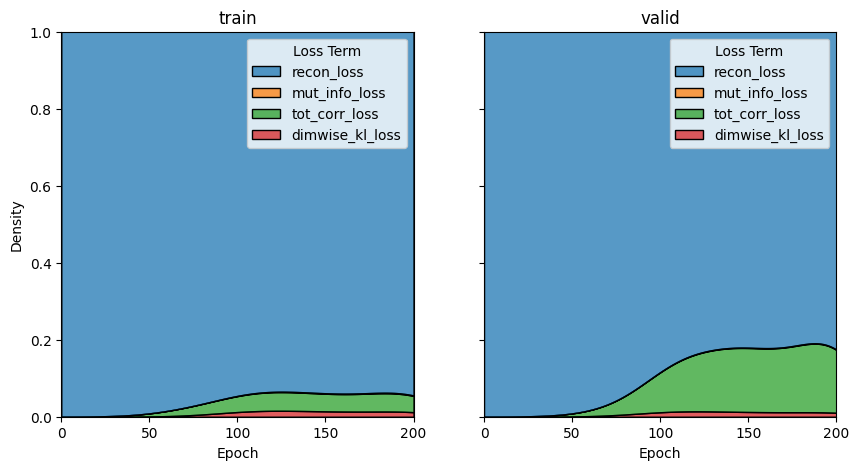

In [5]:
disent._visualizer.show_loss(plot_type="relative")

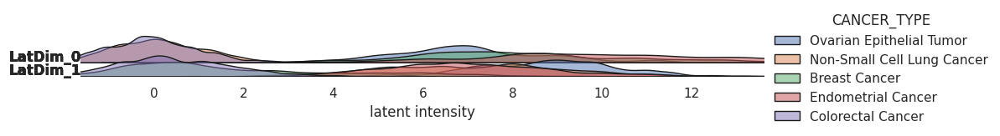

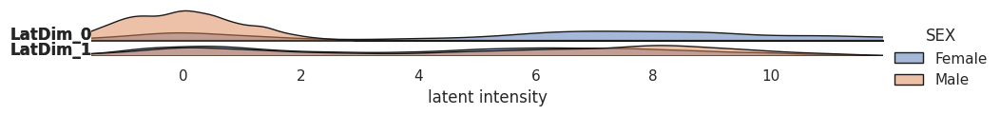

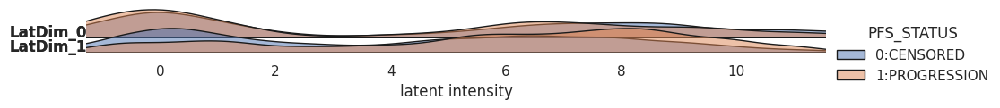

In [6]:
disent._visualizer.show_latent_space(result=disent.result, plot_type="Ridgeline", param=["CANCER_TYPE","SEX","PFS_STATUS"])

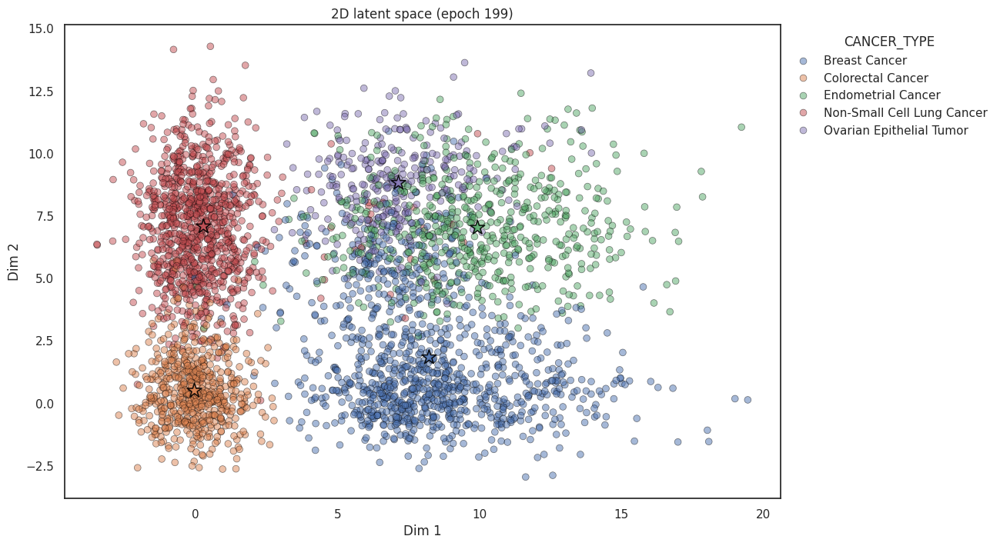

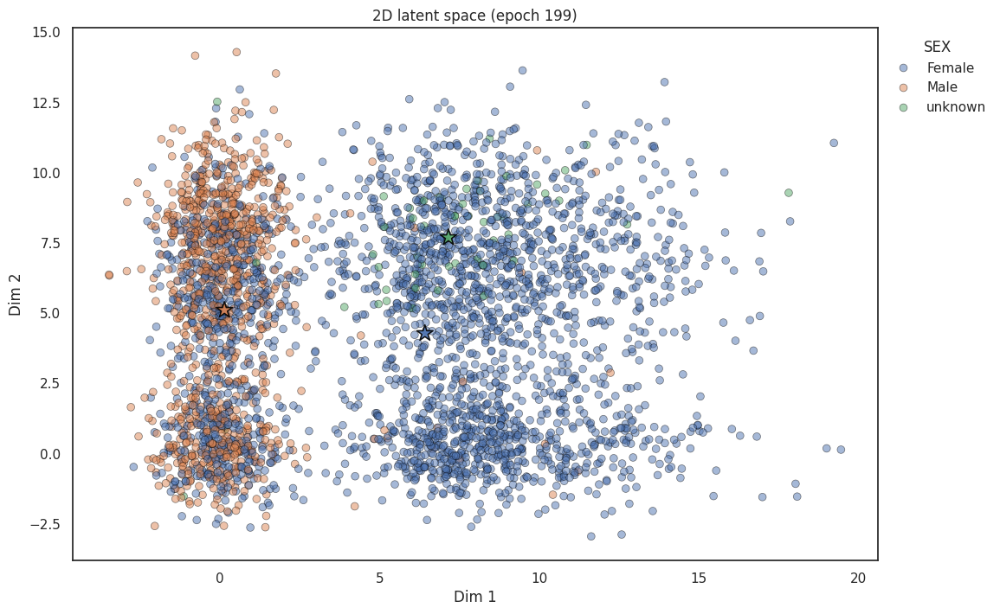

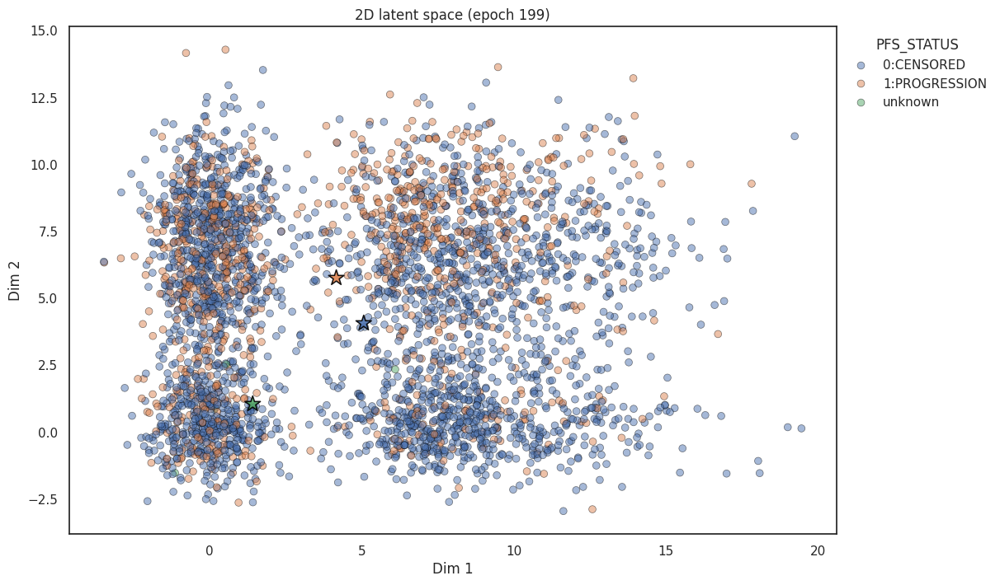

In [7]:
disent._visualizer.show_latent_space(result=disent.result, plot_type="2D-scatter", param=["CANCER_TYPE","SEX","PFS_STATUS"])

The provided label column is numeric and converted to categories.


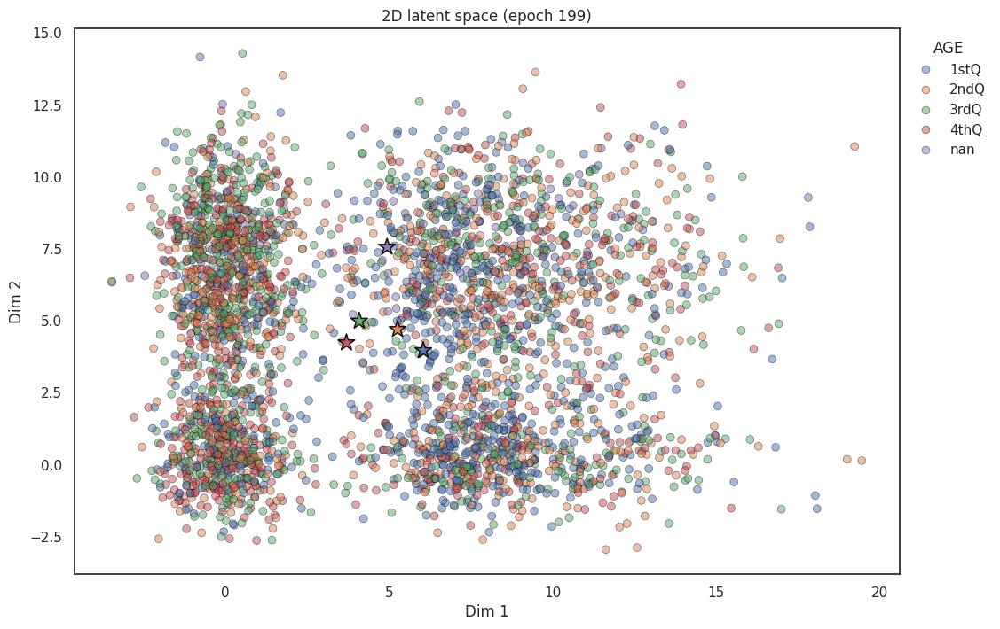

The provided label column is numeric and converted to categories.


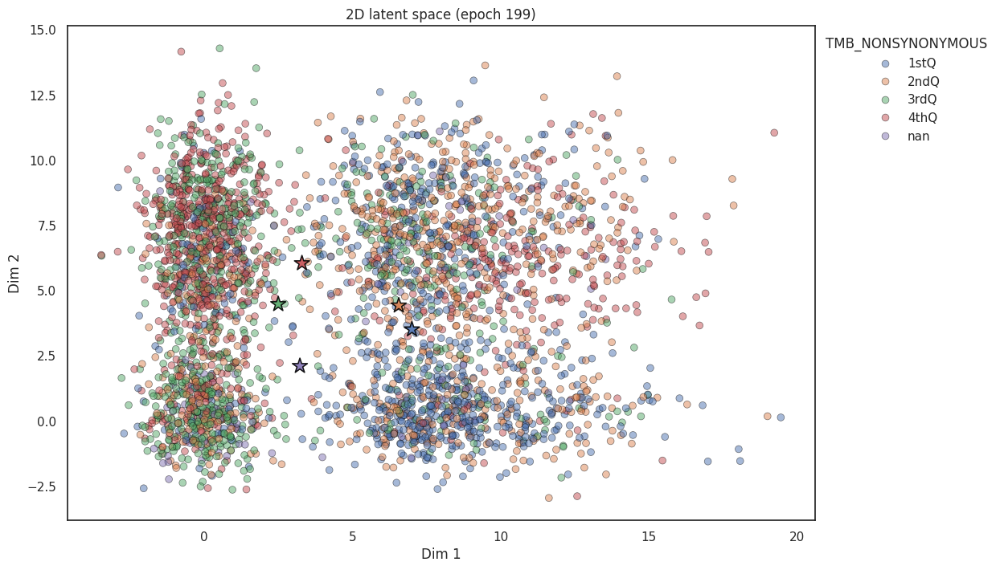

The provided label column is numeric and converted to categories.


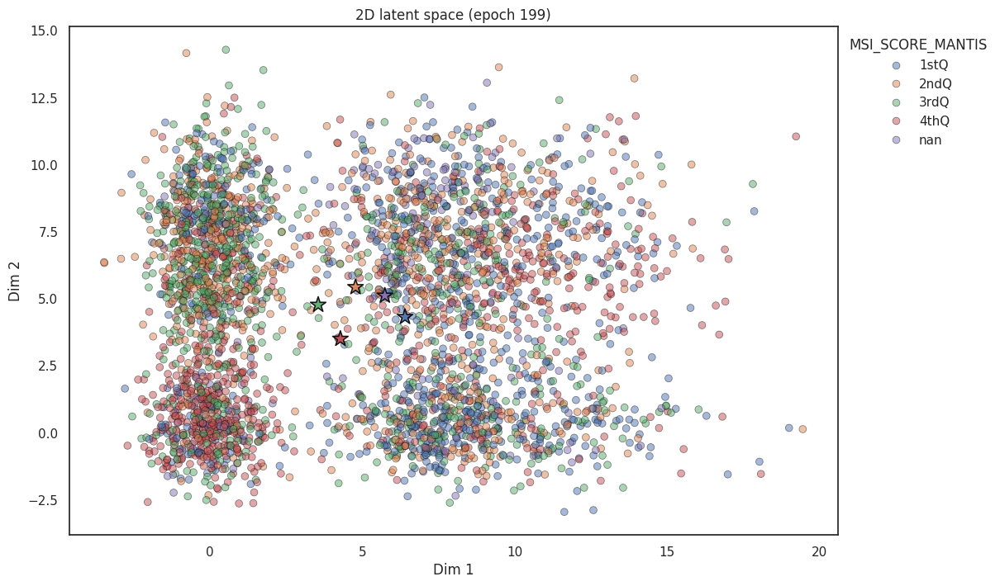

In [8]:
disent._visualizer.show_latent_space(result=disent.result, plot_type="2D-scatter", param=["AGE","TMB_NONSYNONYMOUS", "MSI_SCORE_MANTIS"])

## Train a Varix for comparison

/home/ewald/Github/autoencodix_package/src/autoencodix/base/_base_pipeline.py:189: UserWarning: Your config is of type: <class 'autoencodix.configs.disentanglix_config.DisentanglixConfig'>, for this pipeline the default params of: <class 'autoencodix.configs.varix_config.VarixConfig'> work best
  warnings.warn(


in handle_direct_user_data with data: <class 'autoencodix.data.datapackage.DataPackage'>
--- Running Pairing-Aware Split ---
Identified 3529 fully paired samples across all modalities.
Identified 0 samples present in at least one, but not all, modalities.
Successfully generated synchronized indices for all modalities.
cur shape: transcriptomics: (2470, 1000)
cur shape: epigenetic: (2470, 1000)
cur shape: transcriptomics: (706, 1000)
cur shape: epigenetic: (706, 1000)
cur shape: transcriptomics: (353, 1000)
cur shape: epigenetic: (353, 1000)
Training ...
Epoch 1 - Train Loss: 5561591.7734
Sub-losses: recon_loss: 5561591.6094, var_loss: 0.2177, anneal_factor: 0.0000, effective_beta_factor: 0.0000
Epoch 1 - Valid Loss: 709673.5781
Sub-losses: recon_loss: 709673.4531, var_loss: 0.1128, anneal_factor: 0.0000, effective_beta_factor: 0.0000
Epoch 2 - Train Loss: 4759460.7578
Sub-losses: recon_loss: 4759459.0938, var_loss: 1.6623, anneal_factor: 0.0001, effective_beta_factor: 0.0001
Epoch 2 - 

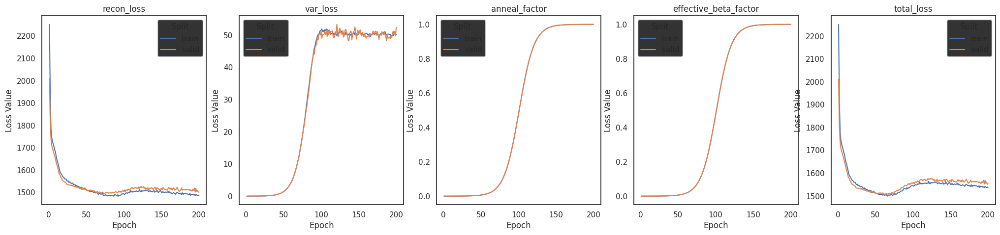

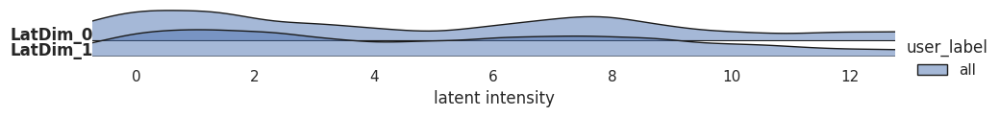

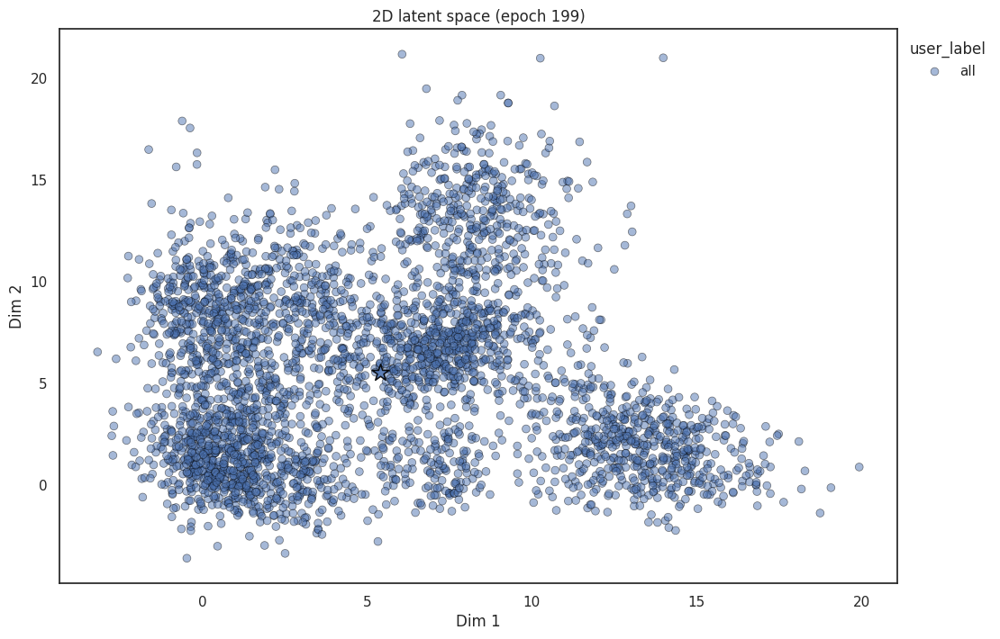

In [9]:
## Varix for comparison
my_cfg.beta = 0.1*10
varix = acx.Varix(data=data_package, config=my_cfg)
varix.run()
varix.show_result()

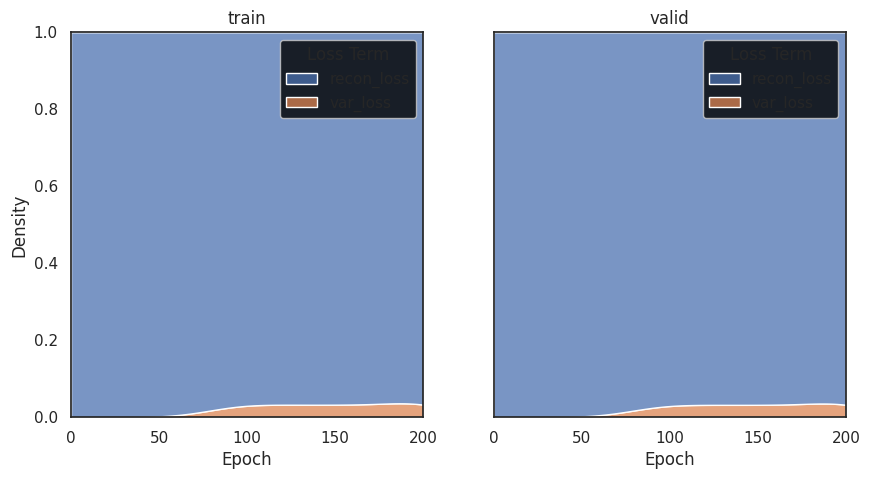

In [10]:
varix._visualizer.show_loss(plot_type="relative")

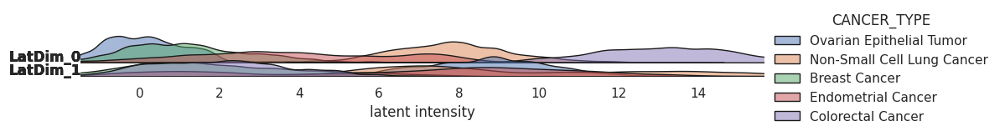

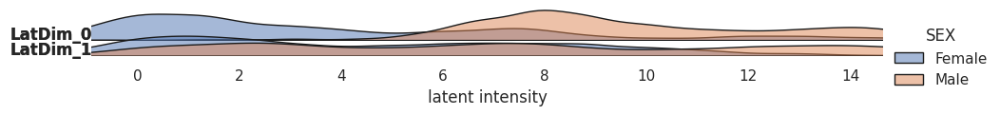

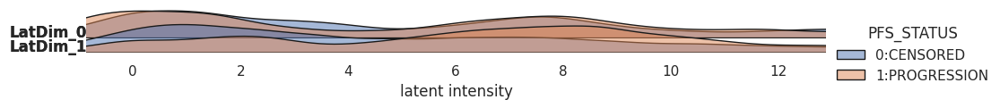

In [11]:
varix._visualizer.show_latent_space(result=varix.result, plot_type="Ridgeline", param=["CANCER_TYPE","SEX","PFS_STATUS"])

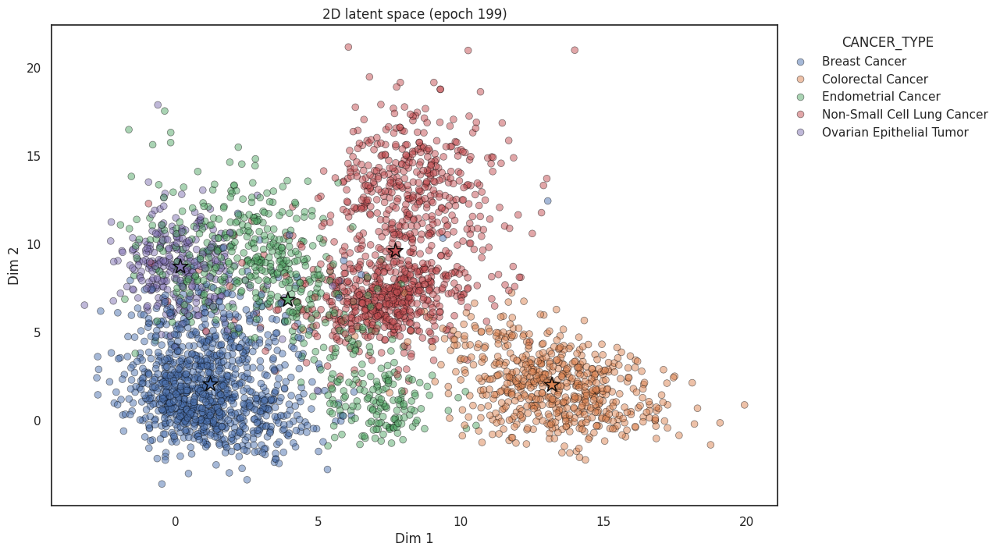

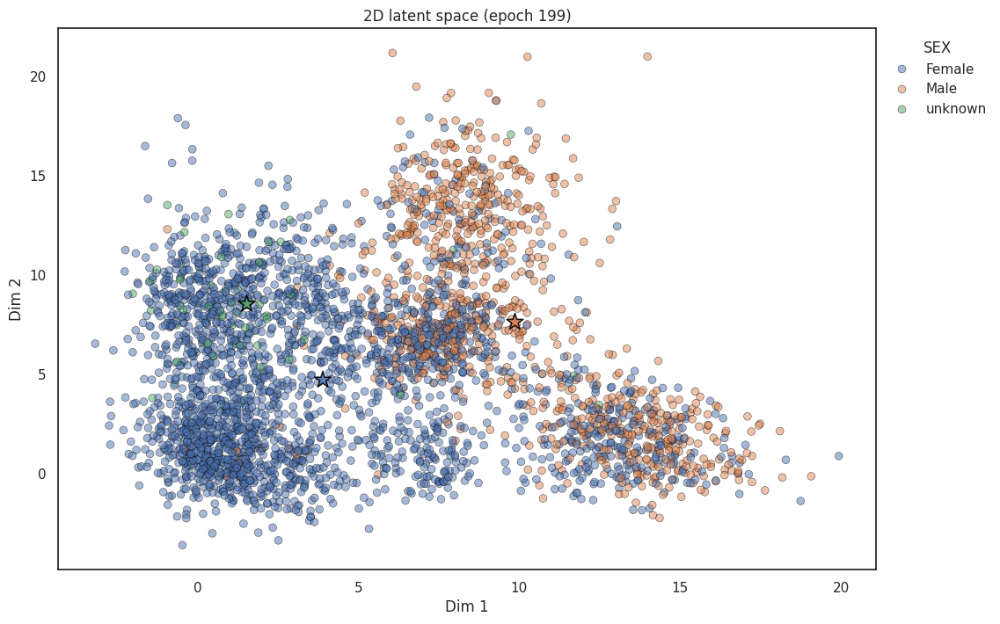

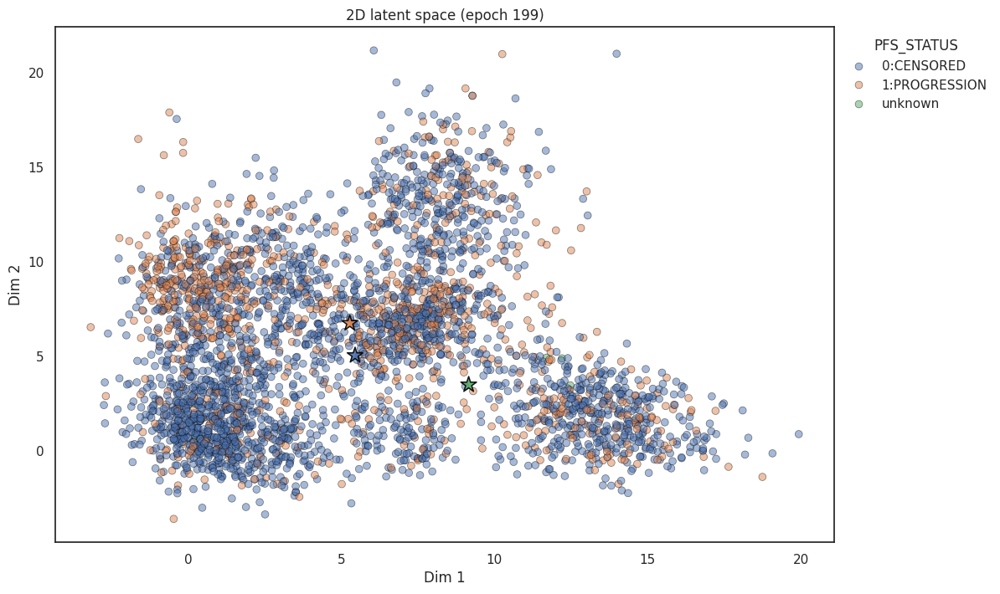

In [12]:
varix._visualizer.show_latent_space(result=varix.result, plot_type="2D-scatter", param=["CANCER_TYPE","SEX","PFS_STATUS"])

The provided label column is numeric and converted to categories.


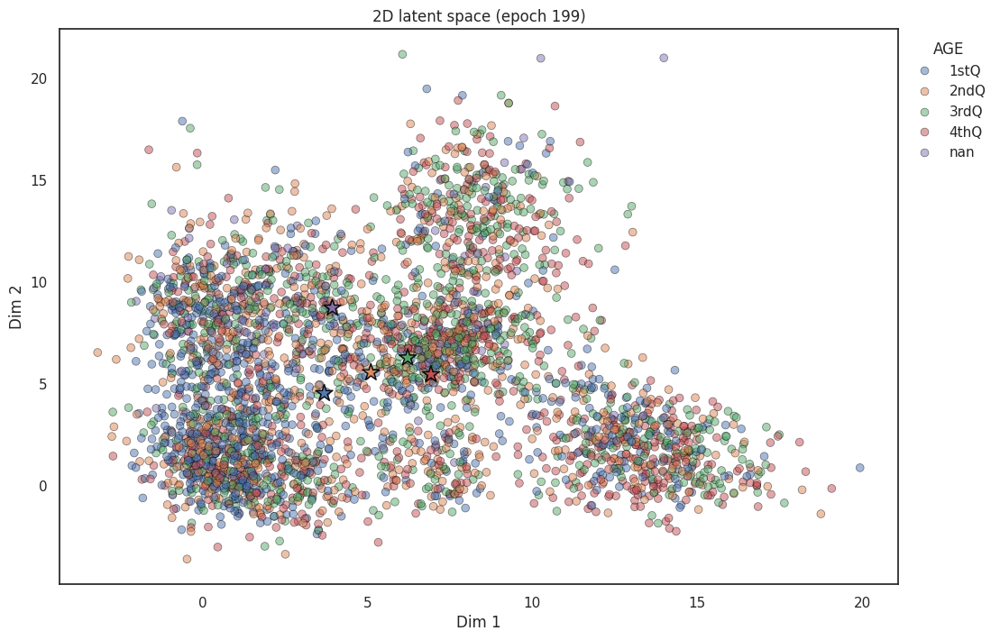

The provided label column is numeric and converted to categories.


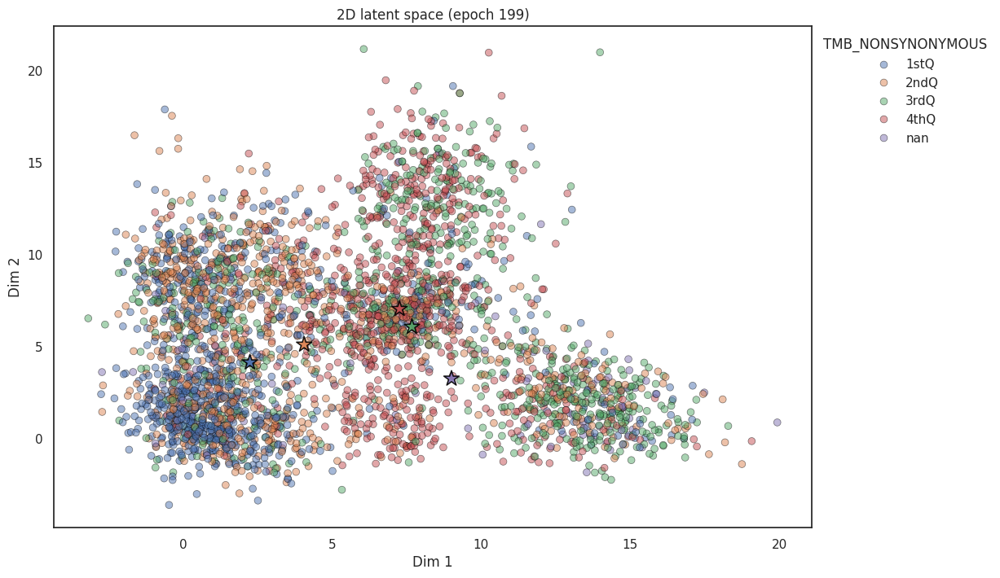

The provided label column is numeric and converted to categories.


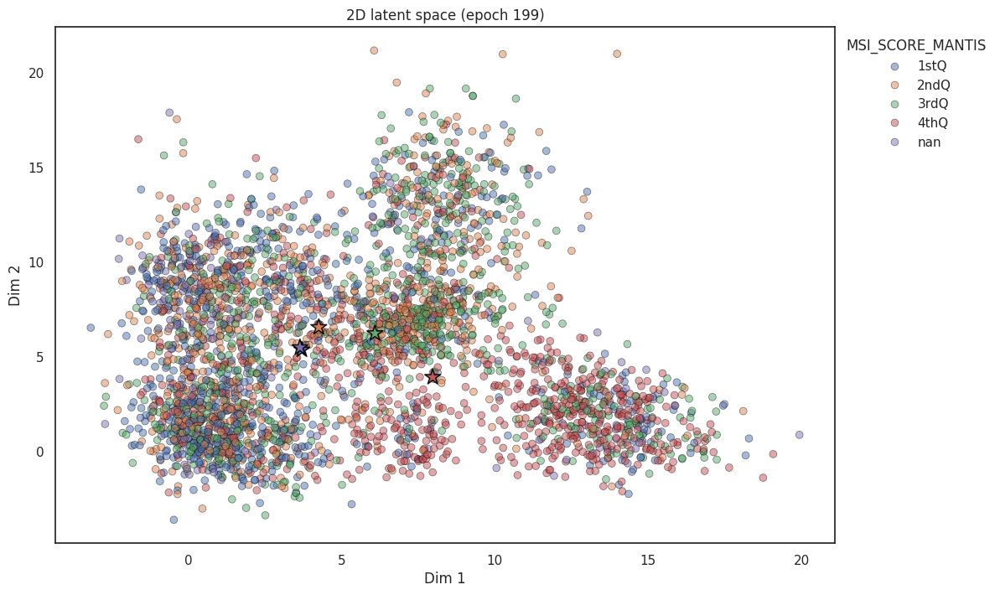

In [13]:
varix._visualizer.show_latent_space(result=varix.result, plot_type="2D-scatter", param=["AGE","TMB_NONSYNONYMOUS", "MSI_SCORE_MANTIS"])

## Comparison to PCA

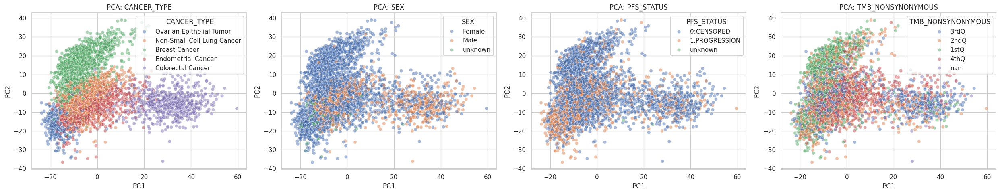

In [14]:
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.decomposition import PCA
sns.set(style="whitegrid")

# Prepare annotation dataframe
anno_df = pd.concat([
	disent._datasets.train.metadata['paired'],
	disent._datasets.test.metadata['paired'],
	disent._datasets.valid.metadata['paired']
])


data_df = pd.concat([
	disent._datasets.train._to_df(),
	disent._datasets.test._to_df(),
	disent._datasets.valid._to_df()
])
# Join data and annotation



pca = PCA(n_components=2)
X_pca = pca.fit_transform(data_df)

df_all = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
df_all['CANCER_TYPE'] = anno_df.loc[data_df.index,'CANCER_TYPE'].values
df_all['SEX'] = anno_df.loc[data_df.index,'SEX'].values
df_all['PFS_STATUS'] = anno_df.loc[data_df.index,'PFS_STATUS'].values
tmb_groups = pd.qcut(x=anno_df.loc[data_df.index, 'TMB_NONSYNONYMOUS' ],
                        q=4,
                        labels=["1stQ", "2ndQ", "3rdQ", "4thQ"],
                    ).astype(str).to_list()
df_all['TMB_NONSYNONYMOUS'] = tmb_groups

# Plot for each parameter
params = ['CANCER_TYPE', 'SEX', 'PFS_STATUS', 'TMB_NONSYNONYMOUS']
fig, axes = plt.subplots(1, 4, figsize=(25, 5))
for i, param in enumerate(params):
	ax = axes[i]
	# scatter = ax.scatter(df_all['PC1'], df_all['PC2'], c=pd.factorize(df_all[param])[0], alpha=0.5, cmap='tab10')
	scatter = sns.scatterplot(x='PC1', y='PC2', hue=param, data=df_all, ax=ax, alpha=0.5)
	ax.set_title(f'PCA: {param}')
	ax.set_xlabel('PC1')
	ax.set_ylabel('PC2')
	legend_labels = df_all[param].unique()
	# ax.legend(handles=scatter.legend_elements()[0], labels=legend_labels.tolist(), title=param)
plt.tight_layout()
plt.show()

## Coverage and total correlation plot

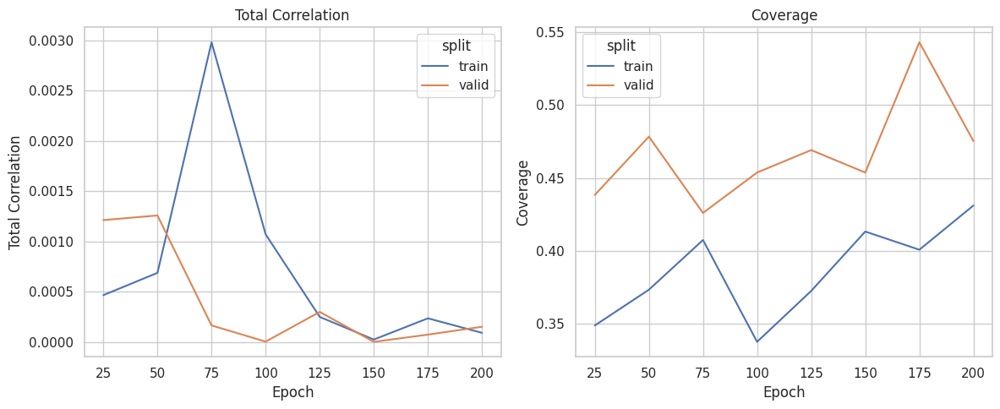

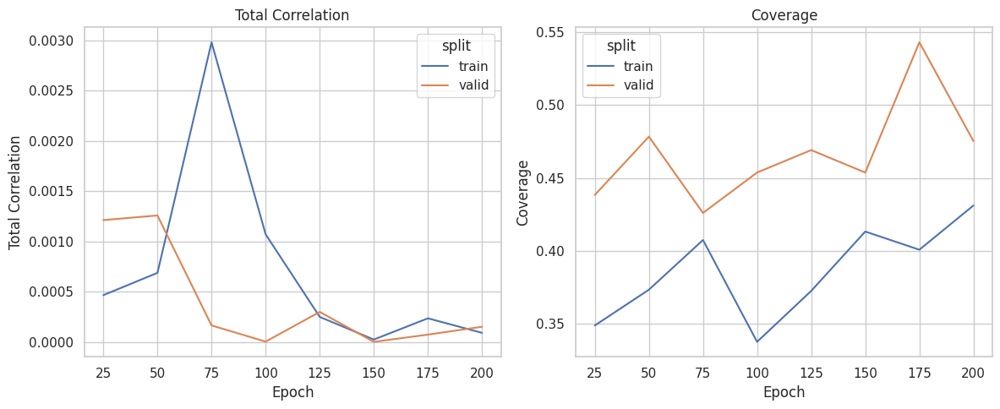

In [15]:
disent._visualizer.show_latent_space(plot_type="Coverage-Correlation", result=disent.result)

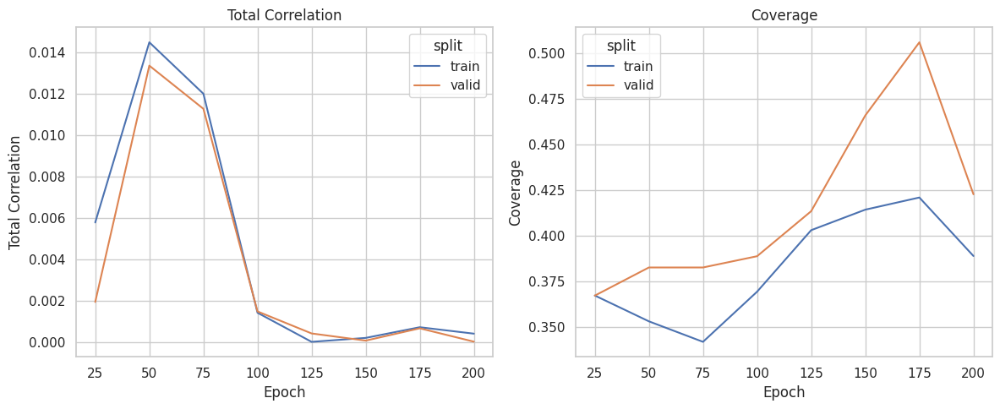

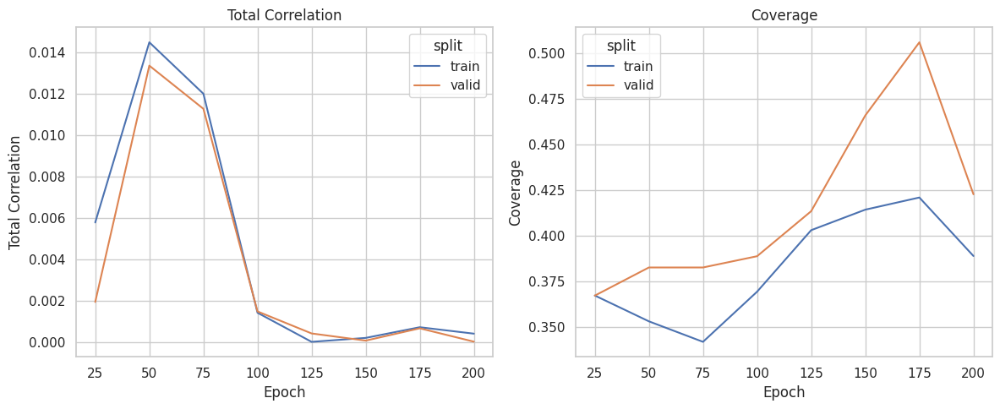

In [16]:
varix._visualizer.show_latent_space(plot_type="Coverage-Correlation", result=varix.result)